# Assignment 1 - CSCI 450 | Malek Elaghel

## Question 1.

### a. Apply a Roberts edge detection filter on the three color components separately and stack the three edge images back together to form a new image. Display the original and new image side by side.

In [61]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters, transform, io, exposure
import os

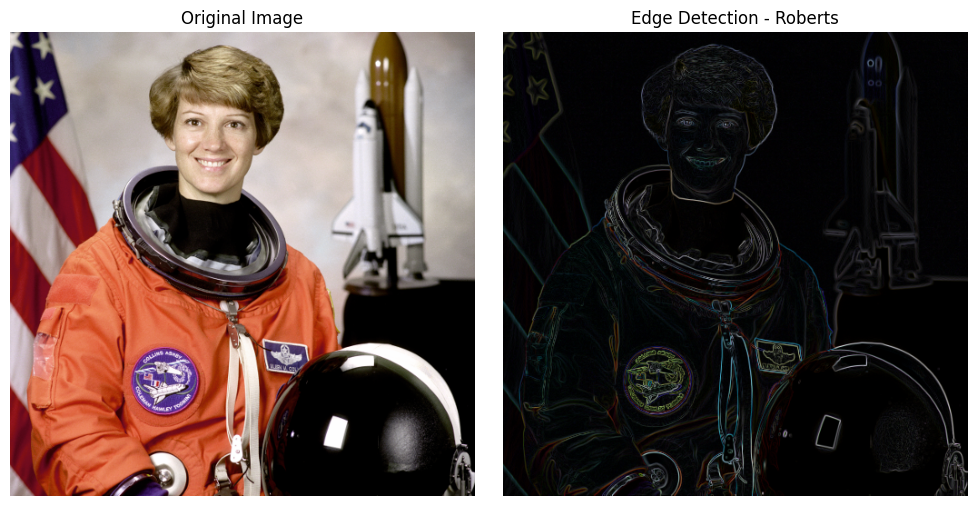

In [42]:
# Load the astronaut image
image = data.astronaut()

# The following has been simplified in the if statement below, as we do not need the colored edges on their own

# # Split the image into color channels
# red_channel = image[..., 0]
# green_channel = image[..., 1]
# blue_channel = image[..., 2]

# # Apply Roberts edge detection to each color channel
# red_edge = filters.roberts(red_channel)
# green_edge = filters.roberts(green_channel)
# blue_edge = filters.roberts(blue_channel)

# # Stack the color-edged images back together
# image_stacked = np.dstack((red_edge, green_edge, blue_edge))

if len(image.shape) == 2:
    image_stacked = filters.roberts(image)
    # Grayscale image
elif len(image.shape) == 3:
    image_stacked = np.dstack([filters.roberts(image[..., i]) for i in range(3)])
# If statement: Help from Autocomplete ^

# Display the original and new image
images = [image, image_stacked]
titles = ["Original Image", "Edge Detection - Roberts"]

# Create a single row of subplots
fig, axes = plt.subplots(1, len(images), figsize=(10, 5))

# Iterate through images and titles, displaying them in subplots:
for ax, img, title in zip(axes, images, titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.show()



### b. Reduce the image length and width each to 25% of the original, and scale it back up to the original size. Display the original and modified images side by side.
(Hint: lookup skimage.transform.rescale())

In [43]:
print(image.shape)

(512, 512, 3)


(512, 512, 3)
float64


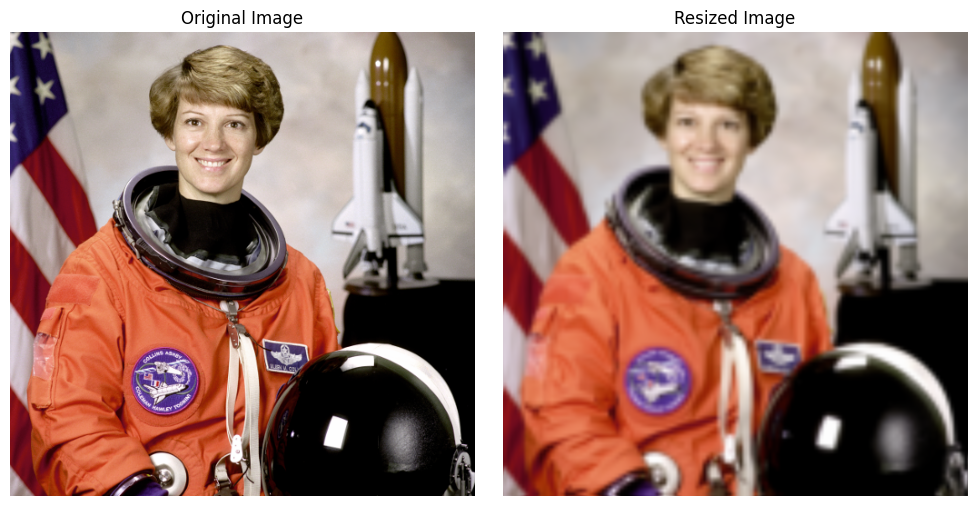

In [48]:
# Define the scaling factor (0.25 for 25% reduction)
scaling_factor = 0.25

# Rescale the image to 25% of the original size
rescaled_image = transform.rescale(
    image, scaling_factor, channel_axis=2)
# Channel Axis is from documentations: https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.rescale
# When provided, the scaling factor works on both axes in all channels.

# Resize the smaller image back to the original size
resized_image = transform.resize(rescaled_image, image.shape)

# CHecks
print(resized_image.shape)
print(resized_image.dtype)


# Display the original and new image
images = [image, resized_image]
titles = ["Original Image", "Resized Image"]

# Create a single row of subplots
fig, axes = plt.subplots(1, len(images), figsize=(10, 5))

# Iterate through images and titles, displaying them in subplots:
for ax, img, title in zip(axes, images, titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.show()


## Question 2.

### Download the Oxford 102 Category Flowers dataset from here: https://www.robots.ox.ac.uk/~vgg/data/flowers/102/ for this problem. Do the same retrieval experiment as demonstrated in class, but use both Euclidean Distance and Manhattan distance, and use both the HSV color space and RGB to calculate the color histogram. Show the top 25 images from the four separate retrieval sets and say which you believe is the best.

In [103]:
path = 'jpg'
imagelist = os.listdir(path)
len(imagelist)

8189

In [104]:
# This is to eliminate the 'Thumbs.db' filename from the list
if imagelist[-1]=='Thumbs.db':
    imagelist = imagelist[:-1]
len(imagelist)

8189

In [105]:
def im_normalize(image):
    # If grayscale, duplicate the single channel to create a 3-channel image
    if len(image.shape) == 2:
        image = np.stack((image, image, image), axis=2)

    # Normalize each color channel
    image = np.float64(image)
    image -= image.min(axis=(0, 1), keepdims=True)
    image /= image.max(axis=(0, 1), keepdims=True)
    image = np.uint8(image * 255)


    return image



In [106]:
def color_histogram_rbg(image):
    image = im_normalize(image)

    # Compute histogram for each color channel
    h = np.concatenate([exposure.histogram(image[..., i])[0]
                       for i in range(3)], axis=None)

    # Normalize histogram
    h = h / (image.shape[0]*image.shape[1])

    return h


def color_histogram_hsv(image):
    image = im_normalize(image)
    image = color.rgb2hsv(image)


    # Compute histogram for each color channel
    h = np.concatenate([exposure.histogram(image[..., i])[0]
                       for i in range(3)], axis=None)

    # Normalize histogram
    h = h / (image.shape[0]*image.shape[1])

    return h


Processing RBG images:

In [107]:
featuresize = 768 # 3 channels * 256 bins (color range)

features_rbg = np.empty((len(imagelist),featuresize))

# Process each image
for i, imagename in enumerate(imagelist):
    image = io.imread(os.path.join(path, imagename))
    features_rbg[i, :] = color_histogram_hsv(image)
    # if image.shape[-1] == 3:  # Check if the image has 3 channels (RGB)
    #     features[i, :] = color_histogram(image)
    # else:
    #     # Duplicate single channel to create a 3-channel image
    #     features[i, :] = compute_color_histogram(np.stack((image,) * 3, axis=-1))
    line = f'\rProcessing RBG images: {i + 1} of {len(imagelist)}'
    print(line, end='')


Processing RBG images: 8189 of 8189

Processing HSV images:

In [118]:
features_hsv = np.empty((len(imagelist), featuresize))

for i, imagename in enumerate(imagelist):
    image = io.imread(os.path.join(path, imagename))
    features_hsv[i, :] = color_histogram_hsv(image)
    # if image.shape[-1] == 3:  # Check if the image has 3 channels (RGB)
    #     features[i, :] = color_histogram(image)
    # else:
    #     # Duplicate single channel to create a 3-channel image
    #     features[i, :] = compute_color_histogram(np.stack((image,) * 3, axis=-1))
    line = f'\rProcessing HSV images: {i + 1} of {len(imagelist)}...'
    print(line, end='')


Processing HSV images: 8189 of 8189...

Random Picture

(-0.5, 499.5, 654.5, -0.5)

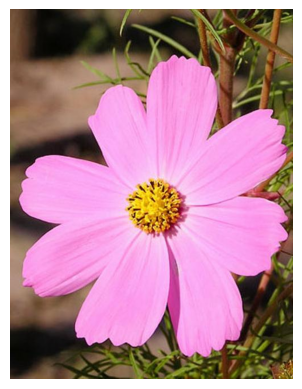

In [112]:
# Choose a random image to use as the query
querynum = np.random.randint(len(imagelist))

# Retrieve the query image
queryimage = io.imread(os.path.join(path, imagelist[querynum]))
plt.imshow(queryimage)
plt.axis('off')

Defining Distances:

In [113]:
# Euclidean Distance
def euclidean_distance(a, b):
    a = np.array(a)
    b = np.array(b)
    return np.sqrt(np.sum((a - b) ** 2))

# Manhattan Distance


def manhattan_distance(a, b):
    a = np.array(a)
    b = np.array(b)
    return np.sum(np.abs(b - a))


1. RBG Photo Distances

In [114]:
# EUCLIDEAN DISTANCE
distances_euclidean_rbg = np.zeros(len(imagelist))

# Comparing the distance of the query image and every image in the dataset
for i in range(len(imagelist)):
    distances_euclidean_rbg[i] = euclidean_distance(
        features_rbg[querynum, :], features_rbg[i, :])
    line = '\rProcessing ' + str(i+1) + ' of ' + str(len(imagelist))
    print(line, end='')

order_euclidean_rbg = np.argsort(distances_euclidean_rbg)
order_euclidean_rbg


Processing 8189 of 8189

array([6931, 7646, 1831, ..., 5090, 6793, 3339], dtype=int64)

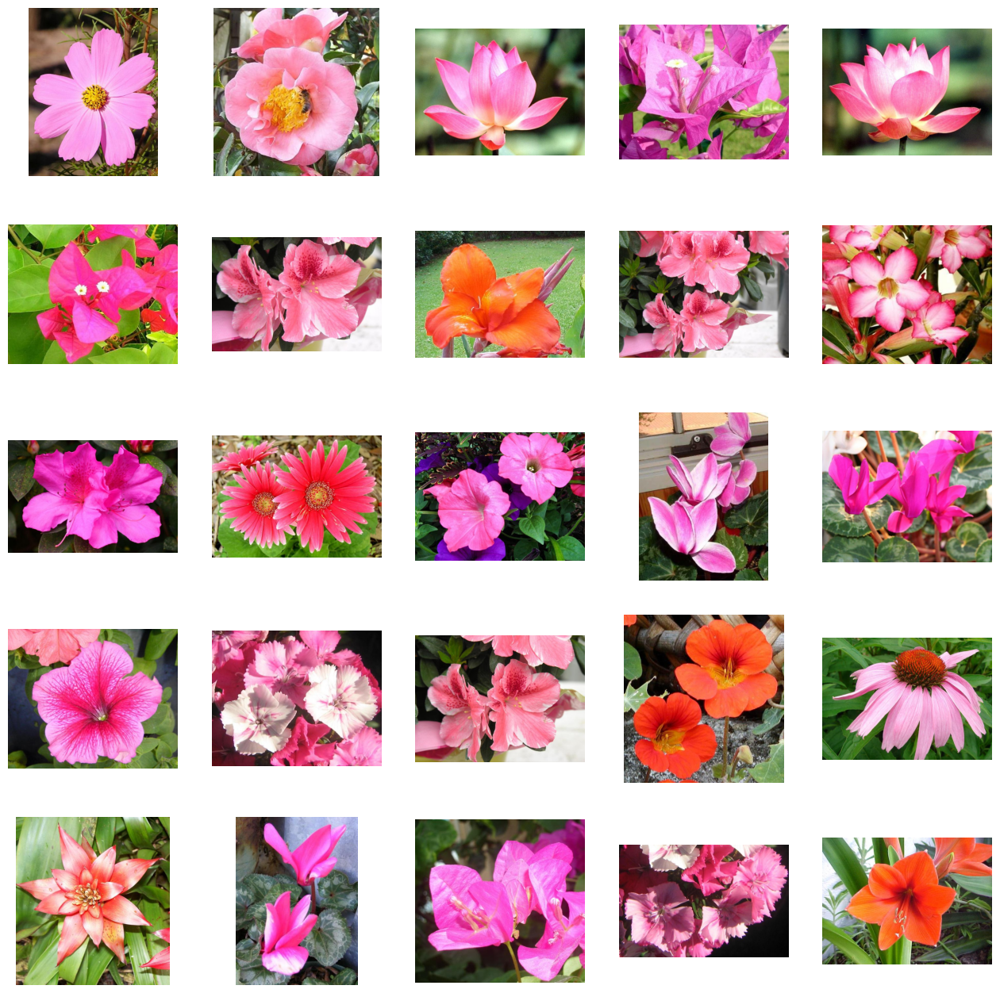

In [116]:
fig = plt.figure(figsize=[16,16])
rows = 5
cols = 5
for i in range(rows*cols):
    image = io.imread(path + '/' + imagelist[order_euclidean_rbg[i]])
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(image)
    plt.axis('off')

plt.show()

Processing 8189 of 8189

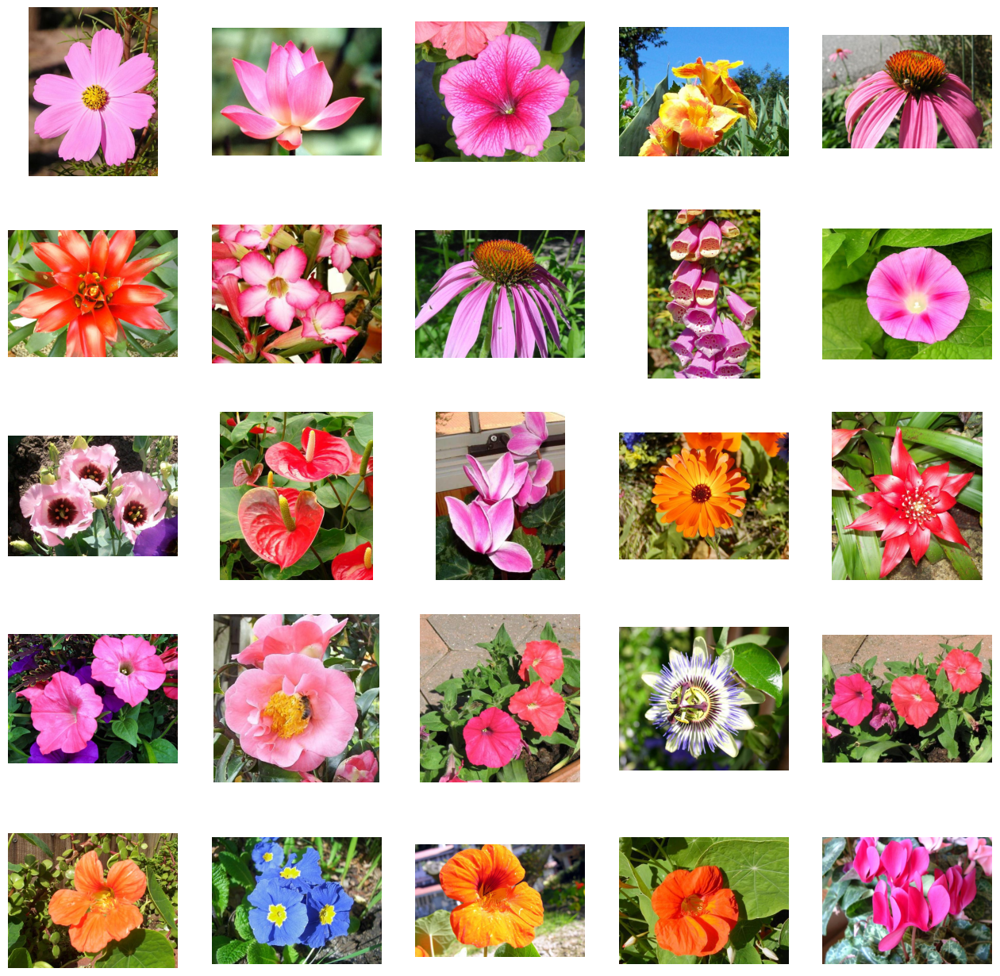

In [117]:
# MANHATTAN DISTANCE
distances_manhattan_rbg = np.zeros(len(imagelist))

# Comparing the distance of the query image and every image in the dataset
for i in range(len(imagelist)):
    distances_manhattan_rbg[i] = manhattan_distance(
        features_rbg[querynum, :], features_rbg[i, :])
    line = '\rProcessing ' + str(i+1) + ' of ' + str(len(imagelist))
    print(line, end='')

order_manhattan_rbg = np.argsort(distances_manhattan_rbg)
print(order_manhattan_rbg)

fig = plt.figure(figsize=[16,16])
rows = 5
cols = 5
for i in range(rows*cols):
    image = io.imread(path + '/' + imagelist[order_manhattan_rbg[i]])
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(image)
    plt.axis('off')

plt.show()

2. HSV Photo Distances

Processing 8189 of 8189[6931 3984 7494 ... 6793 5090 3339]


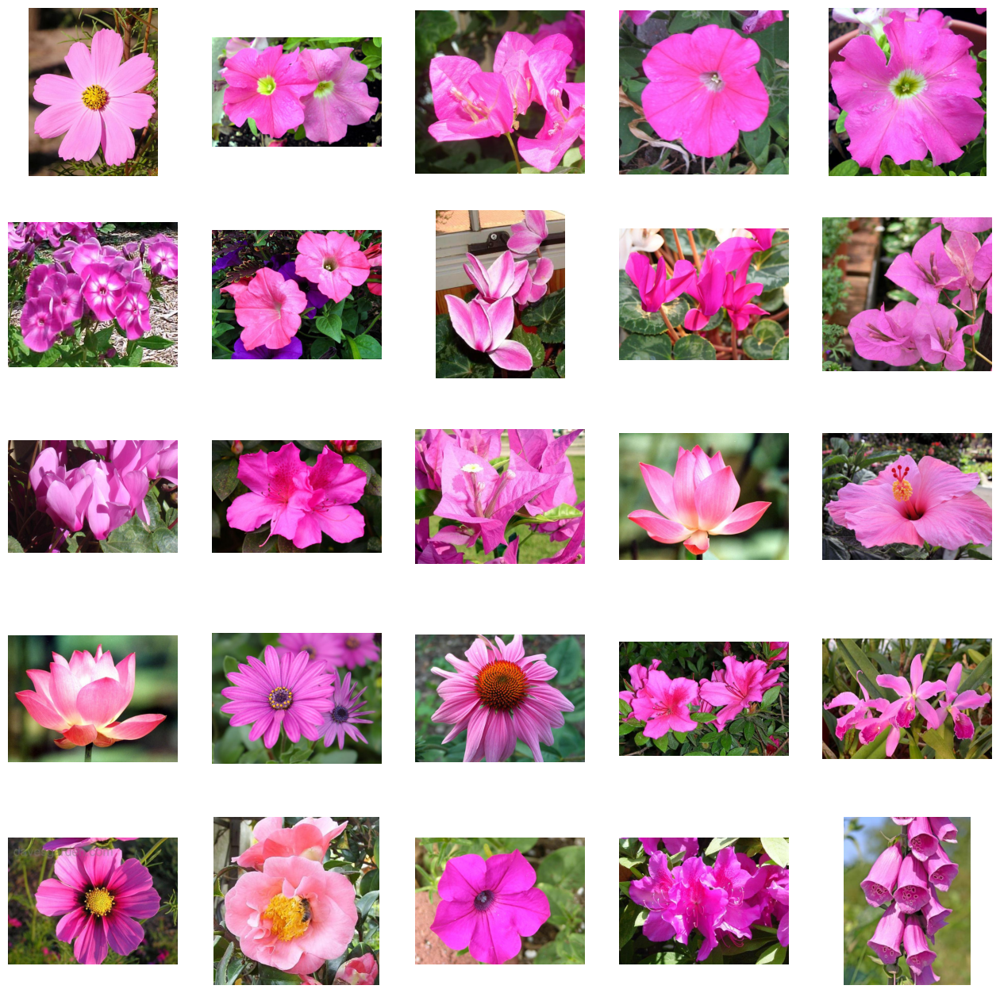

In [119]:
# EUCLIDEAN DISTANCE
distances_euclidean_hsv = np.zeros(len(imagelist))

for i in range(len(imagelist)):
    distances_euclidean_hsv[i] = euclidean_distance(
        features_hsv[querynum, :], features_hsv[i, :])
    line = '\rProcessing ' + str(i+1) + ' of ' + str(len(imagelist))
    print(line, end='')

order_euclidean_hsv = np.argsort(distances_euclidean_hsv)
print(order_euclidean_hsv)

fig = plt.figure(figsize=[16, 16])
rows = 5
cols = 5
for i in range(rows*cols):
    image = io.imread(path + '/' + imagelist[order_euclidean_hsv[i]])
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(image)
    plt.axis('off')

plt.show()


Processing 8189 of 8189[6931 1831  511 ... 5103 8136 7225]


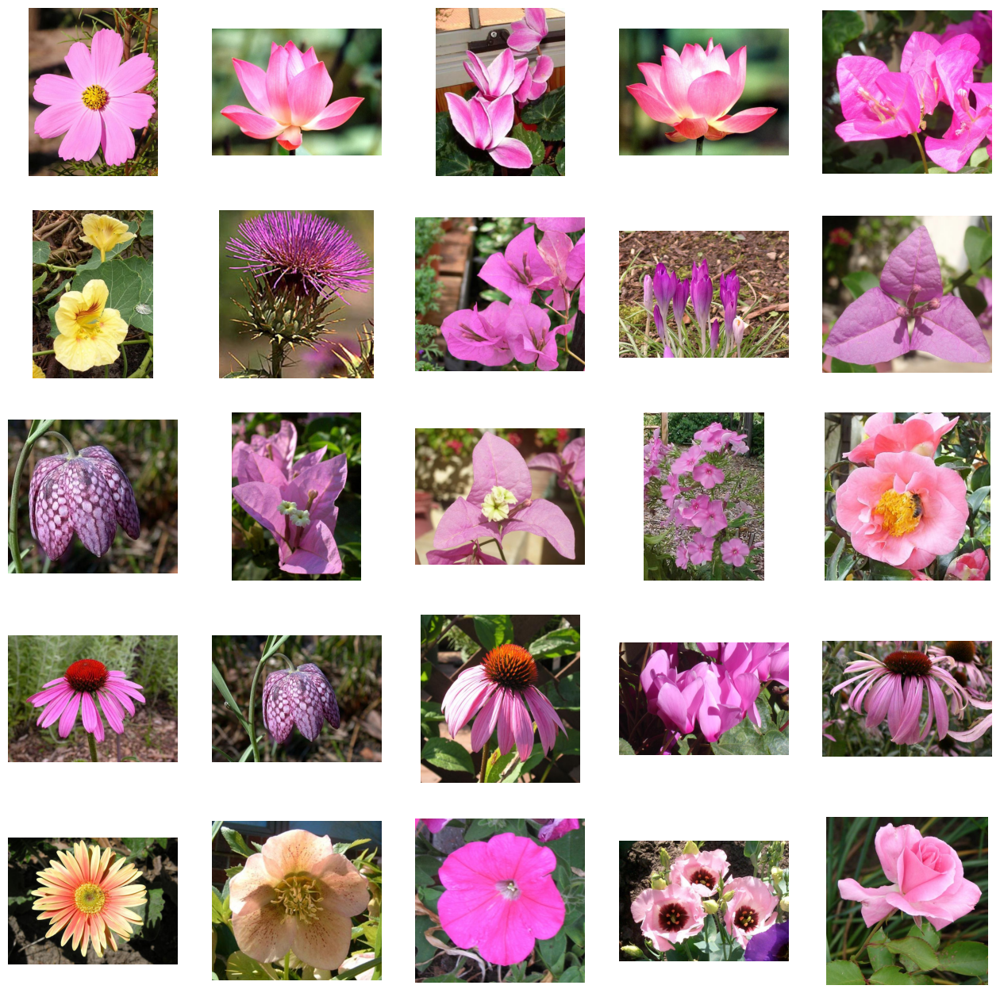

In [120]:
# MANHATTAN DISTANCE
distances_manhattan_hsv = np.zeros(len(imagelist))

# comparing the distance of the query image and every image in the dataset
for i in range(len(imagelist)):
    distances_manhattan_hsv[i] = manhattan_distance(
        features_hsv[querynum, :], features_hsv[i, :])
    line = '\rProcessing ' + str(i+1) + ' of ' + str(len(imagelist))
    print(line, end='')

order_manhattan_hsv = np.argsort(distances_manhattan_hsv)
print(order_manhattan_hsv)

fig = plt.figure(figsize=[16,16])
rows = 5
cols = 5
for i in range(rows*cols):
    image = io.imread(path + '/' + imagelist[order_manhattan_hsv[i]])
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(image)
    plt.axis('off')

plt.show()

## Conclusion.

<ul>
<li > The Euclidean distance methods (both RGB and HSV) performed better overall in retrieving images that closely match the query image of a pink flower.  
<li>It's interesting to note that the HSV color space, although unexpected, seemed to produce images that were closer in terms of color and species to the query image. This suggests that the HSV color space might capture color information more effectively for this particular dataset.
</ul>


In [1]:
import skimage.io
import numpy as np
from skimage.measure import regionprops

def find_green_rectangle(image_path):
    # Load the image
    image = skimage.io.imread(image_path)

    # Define the lower and upper bounds for green color in RGB
    lower_green = np.array([0, 100, 0], dtype=np.uint8)
    upper_green = np.array([50, 255, 50], dtype=np.uint8)

    # Create a mask for the green color
    green_mask = np.all((image >= lower_green) & (image <= upper_green), axis=-1)

    # Find regions in the green mask
    regions = regionprops(green_mask)

    if regions:
        # Find the largest region (the green rectangle)
        max_region = max(regions, key=lambda region: region.area)

        # Get the coordinates of the bounding box
        min_row, min_col, max_row, max_col = max_region.bbox

        # Output the location of the green rectangle
        print("Location of the green rectangle:")
        print("Top-left corner: ({}, {})".format(min_col, min_row))
        print("Bottom-right corner: ({}, {})".format(max_col, max_row))
    else:
        print("No green rectangle found in the image.")

if __name__ == "__main__":
    image_path = "test.jpg"  # Replace with the path to your image
    find_green_rectangle(image_path)


TypeError: Non-integer image types are ambiguous: use skimage.measure.label to label the connected components of label_image, or label_image.astype(np.uint8) to interpret the True values as a single label.

In [3]:
import skimage.io
import numpy as np
from skimage.measure import label, regionprops

def find_green_rectangle(image_path):
    # Load the image
    image = skimage.io.imread(image_path)

    # Define the lower and upper bounds for green color in RGB
    lower_green = np.array([0, 100, 0], dtype=np.uint8)
    upper_green = np.array([50, 255, 50], dtype=np.uint8)

    # Create a mask for the green color
    green_mask = np.all((image >= lower_green) & (image <= upper_green), axis=-1)

    # Convert the mask to an integer type
    green_mask = green_mask.astype(np.uint8)

    # Label connected components in the green mask
    labeled_mask = label(green_mask)

    # Find regions in the labeled mask
    regions = regionprops(labeled_mask)

    if regions:
        # Find the largest region (the green rectangle)
        max_region = max(regions, key=lambda region: region.area)

        # Get the coordinates of the bounding box
        min_row, min_col, max_row, max_col = max_region.bbox

        # Output the location of the green rectangle
        print("Location of the green rectangle:")
        print("Top-left corner: ({}, {})".format(min_col, min_row))
        print("Bottom-right corner: ({}, {})".format(max_col, max_row))
    else:
        print("No green rectangle found in the image.")

if __name__ == "__main__":
    image_path = "test.jpg"  # Replace with the path to your image
    find_green_rectangle(image_path)


Location of the green rectangle:
Top-left corner: (90, 145)
Bottom-right corner: (140, 175)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

# Load the person and place images
person = io.imread('person.jpg')
place = io.imread('place.jpg')

# Check the shape of the person and place images to ensure they have the same dimensions
if person.shape != place.shape:
    raise ValueError("The person and place images should have the same dimensions.")

# Create an output image with the same shape as the person and place images
output = np.zeros_like(person)

# Loop through the rows and columns of the person image
for row in range(person.shape[0]):
    for col in range(person.shape[1]):
        r = person[row, col, 0]
        g = person[row, col, 1]
        b = person[row, col, 2]

        # Define a condition to check whether to use the pixel from the person or place image
        # You can adjust this condition as needed
        if r < b < g:
            output[row, col, :] = place[row, col, :]
        else:
            output[row, col, :] = person[row, col, :]

# Display the output image
plt.imshow(output)
plt.show()


In [12]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

image = io.imread('test.jpg')

# Define a function to check if a pixel is green
def is_green_pixel(pixel):
    r, g, b = pixel
    return  b < g and r < g

# Find the rows and columns that contain green pixels
green_rows, green_cols = np.where(np.apply_along_axis(is_green_pixel, 2, image))

min_row, max_row = min(green_rows), max(green_rows)
min_col, max_col = min(green_cols), max(green_cols)

print("Green Rectangle Location:")
print("Top-Left Corner (row, col): ({}, {})".format(min_row, min_col))
print("Bottom-Right Corner (row, col): ({}, {})".format(max_row, max_col))



Green Rectangle Location:
Top-Left Corner (row, col): (143, 79)
Bottom-Right Corner (row, col): (176, 144)


Green Rectangle Location:
Top-Left Corner (row, col): (143, 79)
Bottom-Right Corner (row, col): (176, 144)


: 

In [16]:
print(green_pixels[1].size)

1920
